In [11]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import easysnowdata
import xrspatial

In [2]:
import dask.distributed
client = dask.distributed.Client()
client


# import coiled
# cluster = coiled.Cluster(idle_timeout="5 minutes",
#                          n_workers=4,
#                          worker_memory="8 GiB",
#                          spot_policy="spot",
#                          #environ={"GDAL_DISABLE_READDIR_ON_OPEN": "EMPTY_DIR"},
#                          #container="mcr.microsoft.com/planetary-computer/python:latest",
#                          workspace="azure",
#                          )

# client = cluster.get_client()


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 16,Total memory: 15.48 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43695,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 16
Started: Just now,Total memory: 15.48 GiB
Comm: tcp://127.0.0.1:42509,Total threads: 4
Dashboard: http://127.0.0.1:42711/status,Memory: 3.87 GiB
Nanny: tcp://127.0.0.1:40867,


In [ ]:
# inspired by https://revues.cirad.fr/index.php/cahiers-agricultures/article/view/30890
# #https://www.sciencedirect.com/science/article/pii/S2352938521000835 could be interesting
# also interestin https://biblio.iita.org/documents/U95BkThenkabailMappingNothomNodev.pdf-41bb8aec87c6dab9f11466697617fb66.pdf page 11!

In [3]:
geometries_gdf = gpd.read_file('geoBoundaries-BEN-ADM2.geojson')
geometries_gdf

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Abomey,,17685819B36696986957740,BEN,ADM2,"POLYGON ((2.03408 7.21894, 2.02941 7.22122, 2...."
1,Abomey-Calavi,,17685819B50728061848372,BEN,ADM2,"POLYGON ((2.21874 6.45584, 2.22165 6.44737, 2...."
2,Adja-Ouere,,17685819B3857845768140,BEN,ADM2,"POLYGON ((2.53742 7.187, 2.53644 7.18604, 2.52..."
3,Adjarra,,17685819B66402044537068,BEN,ADM2,"POLYGON ((2.65862 6.4436, 2.66423 6.4395, 2.66..."
4,Adjohoun,,17685819B34979669430532,BEN,ADM2,"POLYGON ((2.4154 6.6334, 2.42295 6.63205, 2.42..."
...,...,...,...,...,...,...
72,Djougou,,17685819B31222842827733,BEN,ADM2,"POLYGON ((1.97254 9.35332, 1.98401 9.35644, 2...."
73,Tanguieta,,17685819B98348434447391,BEN,ADM2,"POLYGON ((1.2012 10.44008, 1.54246 10.72666, 1..."
74,Materi,,17685819B2600041724770,BEN,ADM2,"POLYGON ((1.04118 10.53758, 1.0496 10.54591, 1..."
75,Karimama,,17685819B85973060374162,BEN,ADM2,"POLYGON ((2.84185 11.43059, 2.85411 11.45275, ..."


In [4]:
geometries_gdf.explore()

In [5]:
dassa_zoume_gdf = geometries_gdf[geometries_gdf['shapeName'] == 'Dassa-Zoume']
dassa_zoume_gdf

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
26,Dassa-Zoume,,17685819B57031298313635,BEN,ADM2,"POLYGON ((2.27256 7.52013, 2.30039 7.5013, 2.3..."


In [14]:
dem = easysnowdata.topography.get_copernicus_dem(dassa_zoume_gdf)
dem = dem.rio.reproject('EPSG:32631')

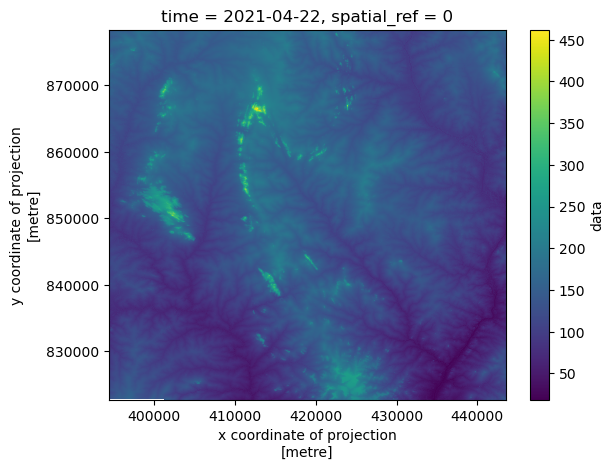

In [15]:
dem.plot.imshow()

In [16]:
slope=xrspatial.slope(dem.compute())
slope

<xarray.DataArray 'slope' (y: 1814, x: 1602)> Size: 12MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * x            (x) float64 13kB 3.944e+05 3.944e+05 ... 4.435e+05 4.435e+05
  * y            (y) float64 15kB 8.783e+05 8.783e+05 ... 8.228e+05 8.227e+05
    time         datetime64[ns] 8B 2021-04-22
    spatial_ref  int64 8B 0

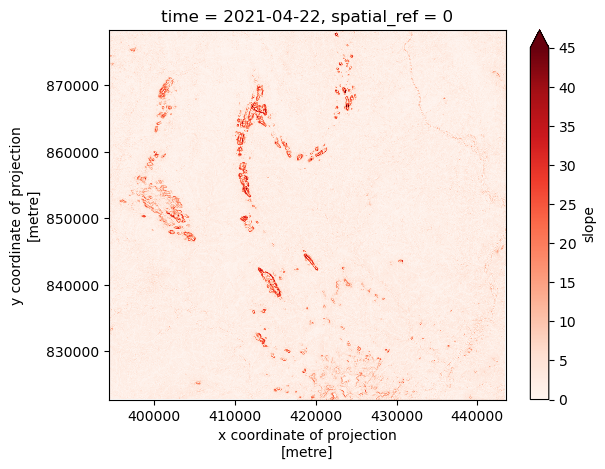

In [18]:
slope.plot.imshow(cmap='Reds',vmin=0,vmax=45)

In [20]:
dassa_zoume_s2 = easysnowdata.remote_sensing.Sentinel2(dassa_zoume_gdf,catalog_choice='earthsearch',remove_nodata=False,harmonize_to_old=False,resolution=30)

Data searched. Access the returned seach with the .search attribute.
Data retrieved. Access with the .data attribute. Data CRS: WGS 84 / UTM zone 31N.
Data scaled to reflectance. To turn this behavior off, set scale_data=False.
Metadata retrieved. Access with the .metadata attribute.


In [21]:
dassa_zoume_s2.data

<xarray.Dataset> Size: 46GB
Dimensions:      (y: 1854, x: 1638, time: 509)
Coordinates:
  * y            (y) float64 15kB 8.783e+05 8.783e+05 ... 8.228e+05 8.227e+05
  * x            (x) float64 13kB 3.944e+05 3.944e+05 ... 4.434e+05 4.435e+05
    spatial_ref  int32 4B 32631
  * time         (time) datetime64[ns] 4kB 2017-01-04T10:22:48.584000 ... 202...
Data variables: (12/16)
    coastal      (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    blue         (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    green        (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    red          (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    rededge      (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    rededge2     (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    ...           ...
    swir16       (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    swir22       (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    aot          (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    scl          (time, y, x) uint8 2GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    wvp          (time, y, x) uint16 3GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
    visual       (time, y, x) uint8 2GB dask.array<chunksize=(1, 1854, 1638), meta=np.ndarray>
Attributes:
    band_info:       {'B01': {'name': 'coastal', 'description': 'Coastal aero...
    scl_class_info:  {0: {'name': 'No Data (Missing data)', 'color': '#000000...

In [22]:
dassa_zoume_s2.get_ndvi()
dassa_zoume_s2.get_rgb()

NDVI data calculated. Access with the .ndvi attribute.
RGB data retrieved. Access with the .rgb attribute, or .rgb_norm for normalized RGB.


In [23]:
dassa_zoume_s2.rgb

<xarray.DataArray (band: 3, time: 509, y: 1854, x: 1638)> Size: 9GB
dask.array<stack, shape=(3, 509, 1854, 1638), dtype=uint16, chunksize=(1, 1, 1854, 1638), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) float64 15kB 8.783e+05 8.783e+05 ... 8.228e+05 8.227e+05
  * x            (x) float64 13kB 3.944e+05 3.944e+05 ... 4.434e+05 4.435e+05
    spatial_ref  int32 4B 32631
  * time         (time) datetime64[ns] 4kB 2017-01-04T10:22:48.584000 ... 202...
  * band         (band) object 24B 'red' 'green' 'blue'
Attributes:
    band_info:       {'B01': {'name': 'coastal', 'description': 'Coastal aero...
    scl_class_info:  {0: {'name': 'No Data (Missing data)', 'color': '#000000...

Text(0.5, 1.02, 'Dassa-Zoume Commune, Benin\nSentinel-2 imagery from 19th December 2023')

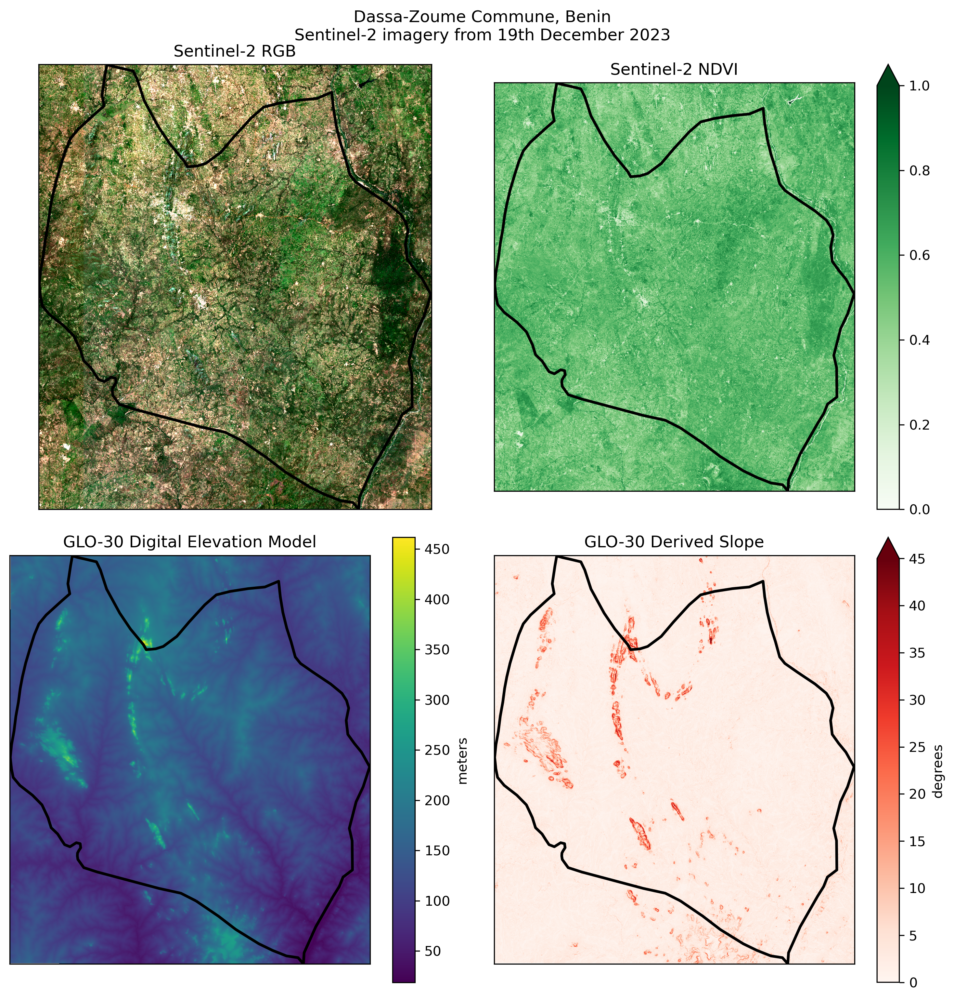

In [27]:
f,axs=plt.subplots(2,2,figsize=(10,10),dpi=300)
dassa_zoume_s2.rgb_norm.sel(time='2023-12-19').squeeze().plot.imshow(robust=True,ax=axs[0,0]) # scale PER IMAGE!!!!!!!!!!! fix in easysnowdata NORM
dassa_zoume_s2.ndvi.sel(time='2023-12-19').squeeze().plot.imshow(cmap='Greens',vmin=0,vmax=1,ax=axs[0,1]) # scale PER IMAGE!!!!!!!!!!! fix in easysnowdata NORM
dem.plot.imshow(ax=axs[1,0],cbar_kwargs={'label':'meters'})
slope.plot.imshow(cmap='Reds',vmin=0,vmax=45,ax=axs[1,1],cbar_kwargs={'label':'degrees'})

for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    dassa_zoume_gdf.to_crs(dassa_zoume_s2.data.rio.crs).plot(ax=ax,facecolor='none',edgecolor='black',linewidth=2)

axs[0,0].set_title('Sentinel-2 RGB')
axs[0,1].set_title('Sentinel-2 NDVI')
axs[1,0].set_title('GLO-30 Digital Elevation Model')
axs[1,1].set_title('GLO-30 Derived Slope')

f.tight_layout()
f.suptitle('Dassa-Zoume Commune, Benin\nSentinel-2 imagery from 19th December 2023',y=1.02)

In [29]:
dassa_zoume_s2.rgb_norm.sel(time='2023-12-19').squeeze().rio.to_raster('data/dassa_zoume_rgb.tif',driver='COG')

In [30]:
dassa_zoume_s2.ndvi.sel(time='2023-12-19').squeeze().rio.to_raster('data/dassa_zoume_ndvi.tif',driver='COG')

In [31]:
dem.rio.to_raster('data/dassa_zoume_dem.tif',driver='COG')

In [32]:
slope.rio.to_raster('data/dassa_zoume_slope.tif',driver='COG')

In [ ]:
plt.imshow(odc.algo.to_rgba(dassa_zoume_s2.data.isel(time=-6),bands=('red','green','blue'),clamp=(0,3000)))

In [ ]:
dassa_zoume_s2_annual_ndvi_da = dassa_zoume_s2.ndvi.resample(time='1YE').median().persist()

In [ ]:
dassa_zoume_s2_annual_ndvi_da.plot.imshow(col='time', col_wrap=5, cmap='Greens', robust=True)

In [ ]:
dassa_zoume_s2_annual_ndvi_da = dassa_zoume_s2_annual_ndvi_da.compute()

In [ ]:
dassa_zoume_s2_annual_ndvi_da

In [ ]:
dassa_zoume_s2_annual_ndvi_da.plot.imshow(col='time',col_wrap=5)

In [ ]:
dassa_zoume_s2_montly_ndvi = dassa_zoume_s2.ndvi.resample(time='1ME').median().persist()

In [ ]:
dassa_zoume_s2_montly_ndvi.plot.imshow(col='time',col_wrap=6,cmap='Greens',vmin=0,vmax=1)

In [ ]:
dassa_zoume_s2_ds.ndvi.sel(time='2024-06-26').squeeze().plot.imshow()